## Creating new model using Independent Component Analysis (ICA)

ICA is a method in signal processing used to separate mixed signals into additive subcomponents. It has been widely used for gesture extraction, gene clustering, and classification in microarray data analysis, making it a viable option for our dataset. 

In [1]:
import pandas as pd
import numpy as np

from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import FastICA

from sklearn.pipeline import Pipeline
from sklearn.linear_model import LogisticRegression
from sklearn.base import clone

from sklearn.model_selection import cross_val_score, StratifiedKFold, GridSearchCV
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, roc_auc_score, roc_curve

import matplotlib.pyplot as plt
import seaborn as sns


In [2]:
path = ['./Data/X_train.csv', './Data/y_train.csv']
X_train, y_train = [pd.read_csv(f, index_col=0) for f in path]

y_train = np.array(y_train['Cluster'])

print(X_train.shape)
print(y_train.shape)

X_train_temp = X_train.copy()

(610, 18644)
(610,)


## Initial model

Testing out the structure of the pipeiline using ICA, and seeing how well it performs from its accuracy score. 

In [3]:
ica_log_pipe = Pipeline([
    ('scaler', StandardScaler()),
    ('ica', FastICA(n_components=10, random_state=42)),
    ('logreg', LogisticRegression(
        penalty='l2',
        solver='lbfgs',
        C=1.0,
        max_iter=2000,
        random_state=42
    ))
])

cv_scores = cross_val_score(ica_log_pipe, X_train, y_train, cv=5, scoring='accuracy', n_jobs=-1)

print(f'Accuracy score: {cv_scores}')
print(f"Cross-validated Accuracy: {cv_scores.mean():.3f} ± {cv_scores.std():.3f}")


Accuracy score: [0.90983607 0.8852459  0.89344262 0.91803279 0.83606557]
Cross-validated Accuracy: 0.889 ± 0.029


## Hyperparameter tuning 

Tuning the model to find the best parameters and number of components to use. 

In [4]:
ica_log_reg_pipe = Pipeline([
    ('scale', StandardScaler()),
    ('ica', FastICA(n_components=2, max_iter=10000, tol=0.01, random_state=42)),
    ('logreg', LogisticRegression(max_iter=10000))
])


param_grid = {
    'ica__n_components':[2, 5, 10, 15],
    'logreg__C': [0.001, 0.01, 0.1, 1, 10],
    'logreg__penalty': ['l2'],
    'logreg__solver': ['lbfgs']
}

# 2) Nested CV
outer_cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=123)
nested_scores_auc = []
nested_scores_acc = []
inner_cv_scores = []
best_params_list = []


X = X_train.copy()
y=y_train.copy()

i=1
for train_idx, test_idx in outer_cv.split(X, y):
    X_outer_train, X_outer_test = X.iloc[train_idx], X.iloc[test_idx]
    y_outer_train, y_outer_test = y[train_idx], y[test_idx]
    
    # Inner CV for hyperparameter tuning
    inner_cv = StratifiedKFold(n_splits=3, shuffle=True, random_state=42)
    grid_search = GridSearchCV(ica_log_reg_pipe, param_grid, cv=inner_cv, scoring='accuracy', n_jobs=-1)
    grid_search.fit(X_train, y_train)

    inner_cv_scores.append(float(grid_search.best_score_))
    best_params_list.append(grid_search.best_params_)

    
    # Evaluate best model on outer test fold
    best_inner_model = clone(grid_search.best_estimator_)
    best_inner_model.fit(X_outer_train, y_outer_train)

    y_outer_proba = best_inner_model.predict_proba(X_outer_test)[:, 1]
    auc = roc_auc_score(y_outer_test, y_outer_proba)
    nested_scores_auc.append(auc)

    acc = accuracy_score(y_outer_test, best_inner_model.predict(X_outer_test))
    nested_scores_acc.append(acc)

    print(f'Fold {i} complete')
    i=i+1

print("\nNested CV (unbiased estimate):")
print("Inner fold accuracies:", inner_cv_scores)
print("Outer fold accuracies:", nested_scores_acc)
print(f"Mean Accuracy: {np.mean(nested_scores_acc)} ± {np.std(nested_scores_acc)}")

print("Outer fold ROC-AUC:", nested_scores_auc)
print(f"Mean ROC-AUC: {np.mean(nested_scores_auc)} ± {np.std(nested_scores_auc)}")

# Summarize best parameters across folds
best_params_df = pd.DataFrame(best_params_list)
print("\nBest parameters per outer fold:")
print(best_params_df)

# Choose the most frequent or best-performing parameter set
final_best_params = best_params_df.mode().iloc[0].to_dict()
print("\nFinal chosen parameters for full training:")
print(final_best_params)



Fold 1 complete
Fold 2 complete
Fold 3 complete
Fold 4 complete
Fold 5 complete

Nested CV (unbiased estimate):
Inner fold accuracies: [0.8983869409832899, 0.8983869409832899, 0.8983869409832899, 0.8983869409832899, 0.8983869409832899]
Outer fold accuracies: [0.9262295081967213, 0.860655737704918, 0.8934426229508197, 0.9016393442622951, 0.8770491803278688]
Mean Accuracy: 0.8918032786885245 ± 0.022237147485656642
Outer fold ROC-AUC: [0.942857142857143, 0.9313628899835796, 0.9580103359173127, 0.9505813953488371, 0.953811369509044]
Mean ROC-AUC: 0.9473246267231833 ± 0.009397916861413533

Best parameters per outer fold:
   ica__n_components  logreg__C logreg__penalty logreg__solver
0                 15        0.1              l2          lbfgs
1                 15        0.1              l2          lbfgs
2                 15        0.1              l2          lbfgs
3                 15        0.1              l2          lbfgs
4                 15        0.1              l2          lbfg

# Visualizing the ICA components

We fit our dataset to ICA with `n_components=15` as it was the top choice from GridSearchCV, and we can not visualize to see how well the components helps to differentate our target groups. 

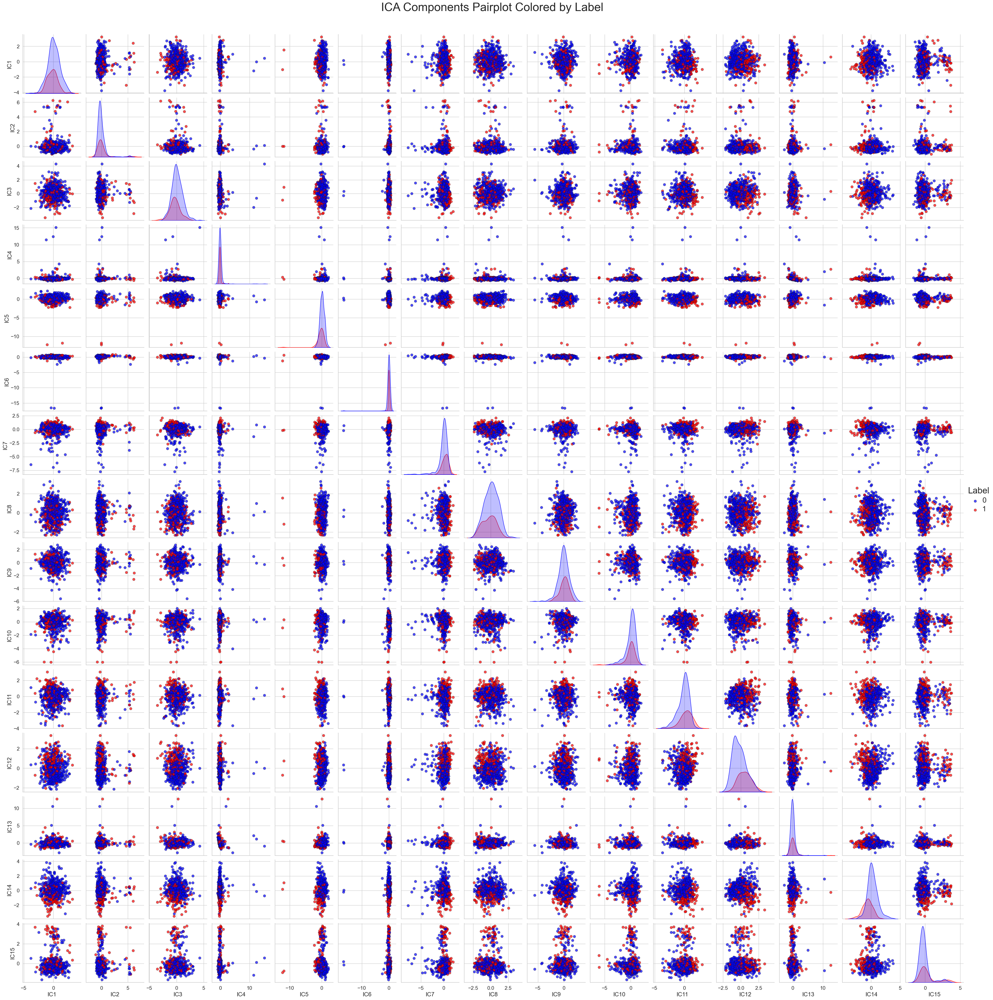

In [5]:
X = StandardScaler().fit_transform(X_train)  # center & scale genes
ica = FastICA(n_components=15, max_iter=10000, tol=0.01, random_state=42)
S = ica.fit_transform(X)       # shape (n_samples, n_components)
A = ica.mixing_                # shape (n_genes, n_components)

# Suppose S = ICA component scores (n_samples x n_components)
# y_train = labels (0 = non-rejection, 1 = rejection)

# Convert to DataFrame
n_components = S.shape[1]
ica_df = pd.DataFrame(S, columns=[f'IC{i+1}' for i in range(n_components)])
ica_df['Label'] = y_train  # make sure it's a Series or array

# Optional: convert label to string for nicer legend
ica_df['Label'] = ica_df['Label'].astype(str)

# Create Seaborn pairplot
sns.set_context("talk", font_scale=1.4)

sns.set(style="whitegrid", context="notebook")
pairplot = sns.pairplot(
    ica_df,
    hue='Label',        # color by class
    palette={'0':'blue','1':'red'},
    corner=False,        # True to have only lower corner, False to have full plots
    plot_kws={'alpha':0.7, 'edgecolor':'k', 's':50}  # adjust marker style
)

pairplot.fig.suptitle("ICA Components Pairplot Colored by Label", y=1.02, fontsize=32)


legend = pairplot._legend
legend.set_title("Label")
for t in legend.texts:
    t.set_fontsize(20)
legend.get_title().set_fontsize(24)

# Increase axis label & tick font sizes
for ax in pairplot.axes.flatten():
    if ax is not None:
        ax.set_xlabel(ax.get_xlabel(), fontsize=16)
        ax.set_ylabel(ax.get_ylabel(), fontsize=16)
        ax.tick_params(axis='both', which='major', labelsize=14)

plt.show()



In [6]:
# Get top genes per component
n_top = 30
for j in range(A.shape[1]):
    col = A[:, j]
    top_idx = np.argsort(np.abs(col))[-n_top:][::-1]
    top_genes = X_train.columns[top_idx]   # if you have gene_names list/array
    print(f"Component {j+1} top genes:", top_genes[:10])

Component 1 top genes: Index(['RIC8A', 'TTBK2', 'PHF3', 'C20orf94', 'RSF1', 'UBQLN4', 'SCAMP3',
       'SNX17', 'SECISBP2L', 'LYST'],
      dtype='object')
Component 2 top genes: Index(['C19orf53', 'UXT', 'RPS15', 'LOC100131128', 'PSENEN', 'PSMG4',
       'TRAPPC5', 'LSM7', 'MRPL52', 'C19orf70'],
      dtype='object')
Component 3 top genes: Index(['ADRBK1', 'ANKRD13D', 'FERMT3', 'IL10RA', 'LBH', 'RASSF1', 'L3MBTL4',
       'FAM176B', 'TGFB1', 'TMSB4X'],
      dtype='object')
Component 4 top genes: Index(['MURC', 'PPP2R3A', 'RBM24', 'A2BP1', 'CAV3', 'DUSP27', 'TRIM54',
       'FBXO40', 'C3orf43', 'RYR3'],
      dtype='object')
Component 5 top genes: Index(['FAM65B', 'IL18RAP', 'CXCR2', 'CEACAM4', 'CSF3R', 'PROK2', 'CLEC4D',
       'TRIM58', 'FGR', 'CMTM2'],
      dtype='object')
Component 6 top genes: Index(['H3F3A', 'NDUFB6', 'PSMB1', 'B2M', 'MMADHC', 'C20orf30', 'PRDX1',
       'COX6C', 'TPT1', 'ATP5J'],
      dtype='object')
Component 7 top genes: Index(['CSRNP1', 'SOCS3', 'ATF3', 'Z

We see that in this model, the genes contributing to Component 14 provides the most distinction compared to the rest of the components. In looking more closely at the top genes within Component 14, these genes contribute to immune function and response, which makes sense as the liver transplants from our dataset were rejected due to the immune system. 

# Using ICA for feature selection

Previously, we directly used the ICA components to fit our dataset and model. 

Now, we can consider using ICA as feature selection to reduce our dataset. 

We apply ICA to our X_train dataset with `n_components=10`, in reference to the paper [INTERLIVER study update_2024.pdf](https://github.com/Erdos-Projects/fall-2025-predicting-liver-graft-acceptance/blob/main/INTERLIVER%20study%20update_2024.pdf) Figure 6, where they break up each target group into 10 (or 9) terms to determine the top enriched pathways for each target. 

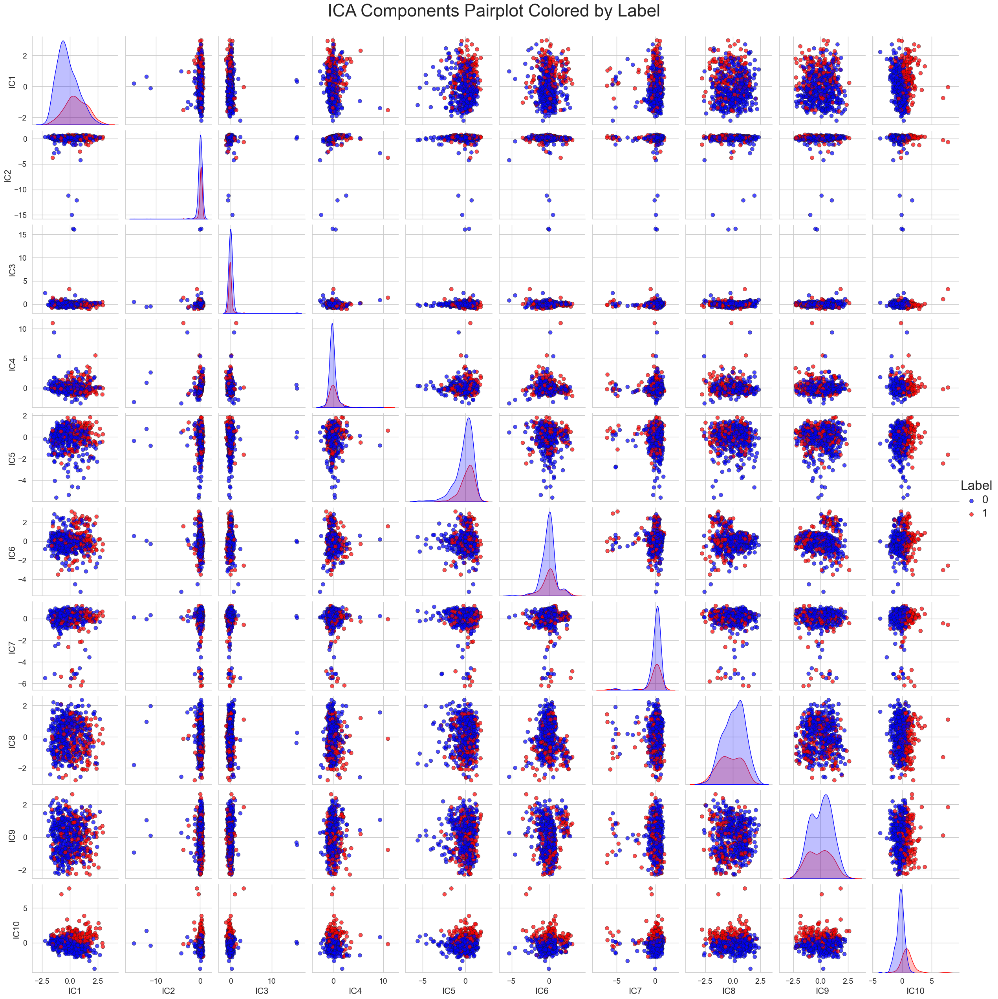

In [7]:
X = StandardScaler().fit_transform(X_train)  # center & scale genes
ica = FastICA(n_components=10, random_state=42)
S = ica.fit_transform(X)       # shape (n_samples, n_components)
A = ica.mixing_                # shape (n_genes, n_components)

# Suppose S = ICA component scores (n_samples x n_components)
# y_train = labels (0 = non-rejection, 1 = rejection)

# Convert to DataFrame
n_components = S.shape[1]
ica_df = pd.DataFrame(S, columns=[f'IC{i+1}' for i in range(n_components)])
ica_df['Label'] = y_train  

ica_df['Label'] = ica_df['Label'].astype(str)

# Create Seaborn pairplot
sns.set_context("talk", font_scale=1.4)

sns.set(style="whitegrid", context="notebook")
pairplot = sns.pairplot(
    ica_df,
    hue='Label',        # color by class
    palette={'0':'blue','1':'red'},
    corner=False,        # True to have only lower corner, False to have full plots
    plot_kws={'alpha':0.7, 'edgecolor':'k', 's':50}  # adjust marker style
)

pairplot.fig.suptitle("ICA Components Pairplot Colored by Label", y=1.02, fontsize=32)

legend = pairplot._legend
legend.set_title("Label")
for t in legend.texts:
    t.set_fontsize(20)
legend.get_title().set_fontsize(24)

# Increase axis label & tick font sizes
for ax in pairplot.axes.flatten():
    if ax is not None:
        ax.set_xlabel(ax.get_xlabel(), fontsize=16)
        ax.set_ylabel(ax.get_ylabel(), fontsize=16)
        ax.tick_params(axis='both', which='major', labelsize=14)

plt.savefig('./Plots/ICA_pairplot_10.png')
plt.show()



In [23]:
# Get top genes per component
n_top = 30
for j in range(A.shape[1]):
    col = A[:, j]
    top_idx = np.argsort(np.abs(col))[-n_top:][::-1]
    top_genes = X_train.columns[top_idx]   # if you have gene_names list/array
    print(f"Component {j+1} top genes:", top_genes[:10])


# Component 10 (0-indexed is 9)
component_idx = 9
col = A[:, component_idx]  # all gene loadings for component 10




Component 1 top genes: Index(['ECT2', 'DRAM1', 'E2F3', 'C12orf4', 'KPNA2', 'YWHAH', 'RFX5', 'TYMS',
       'NUP93', 'ARPC2'],
      dtype='object')
Component 2 top genes: Index(['MURC', 'A2BP1', 'PPP2R3A', 'RBM24', 'CAV3', 'RYR3', 'HRASLS', 'DUSP27',
       'SERPINA1', 'C3orf43'],
      dtype='object')
Component 3 top genes: Index(['NDUFB6', 'MMADHC', 'H3F3A', 'B2M', 'TMEM14C', 'PSMB1', 'COX6C',
       'NAA20', 'SERINC1', 'TPT1'],
      dtype='object')
Component 4 top genes: Index(['HEPH', 'JAM3', 'RERG', 'LHFP', 'HDGFRP3', 'STON1', 'ZNF532', 'AKT3',
       'ATL1', 'LTBP2'],
      dtype='object')
Component 5 top genes: Index(['FLVCR2', 'IL1RL1', 'HARS', 'THBD', 'NAMPT', 'SRXN1', 'YRDC', 'TRIM35',
       'RBBP8', 'ABLIM3'],
      dtype='object')
Component 6 top genes: Index(['GPN1', 'TYW3', 'SRRM2', 'LOC139201', 'NXT2', 'MAP2K4', 'WASH2P',
       'CCDC84', 'SHANK3', 'POT1'],
      dtype='object')
Component 7 top genes: Index(['C19orf53', 'UXT', 'RPS15', 'LOC100131128', 'PSENEN', 'TRAPPC

In [26]:
# Sort by absolute value of loading
n_top = 30  # number of genes you want to select
top_idx = np.argsort(np.abs(col))[-n_top:][::-1]  # indices of top n genes
top_genes = X_train.columns[top_idx]             # select gene names

print(f"Top {n_top} genes for Component 10:")
print(top_genes)

X_train_selected = X_train[top_genes].copy()


Top 30 genes for Component 10:
Index(['PRF1', 'BIN2', 'SELL', 'RAC2', 'AIM2', 'FAM65B', 'PRKCB', 'STX11',
       'CST7', 'KLRD1', 'VAV1', 'CYTIP', 'NKG7', 'CORO1A', 'MYO1F', 'GIMAP5',
       'SELPLG', 'CELF2', 'STK10', 'SLA', 'HK3', 'SASH3', 'IPCEF1', 'TAGAP',
       'TLR8', 'RGS18', 'FAM26F', 'BASP1', 'CD97', 'RUNX3'],
      dtype='object')


## Visualizing how much each gene contributes to Component 10

PRF1      0.747429
BIN2      0.742152
SELL      0.727341
RAC2      0.726115
AIM2      0.720071
FAM65B    0.713548
PRKCB     0.707984
STX11     0.707285
CST7      0.706341
KLRD1     0.700952
dtype: float64
CRYM       -0.471843
MPZL2      -0.469750
ATP8B1     -0.461184
TMEM9      -0.460080
C11orf52   -0.438256
TTC23      -0.430574
DSG2       -0.428650
FAM47E     -0.427375
CAV2       -0.426980
UNC13B     -0.426705
dtype: float64


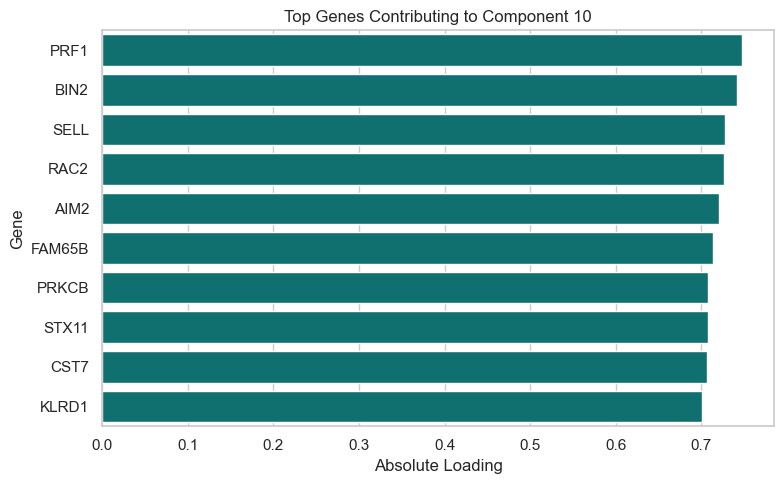

In [27]:
n_top=10
loadings = pd.Series(col, index=X_train.columns)
top_loadings = loadings.abs().sort_values(ascending=False).head(n_top)

print(loadings.sort_values(ascending=False).head(n_top))
print(loadings.sort_values(ascending=True).head(n_top))

plt.figure(figsize=(8,5))
sns.barplot(x=top_loadings.values, y=top_loadings.index, color='teal')
plt.title("Top Genes Contributing to Component 10")
plt.xlabel("Absolute Loading")
plt.ylabel("Gene")
plt.tight_layout()
plt.show()


We now want to investigate how many genes we want to use for further model analysis. 

In [28]:
n_top_list = [10, 20, 30, 50, 75, 100, 150, 200, 300, 400, 500, 1000]

# ICA component loadings
component_idx = 9  # component 10
col = A[:, component_idx]

cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=123)
scores = []

for n_top in n_top_list:
    # Select top n_top genes
    top_idx = np.argsort(np.abs(col))[-n_top:][::-1]
    top_genes = X_train.columns[top_idx]
    
    X_sub = X_train[top_genes]
    
    # Logistic regression
    clf = LogisticRegression(max_iter=5000, random_state=123)
    score = cross_val_score(clf, X_sub, y_train, cv=cv, scoring='accuracy').mean()
    scores.append(score)

print('Mean CV Accuracies: ', scores)

Mean CV Accuracies:  [np.float64(0.9016393442622951), np.float64(0.9), np.float64(0.9016393442622951), np.float64(0.8967213114754099), np.float64(0.9), np.float64(0.8918032786885245), np.float64(0.8967213114754099), np.float64(0.8901639344262294), np.float64(0.8885245901639344), np.float64(0.9032786885245901), np.float64(0.9065573770491803), np.float64(0.9049180327868852)]


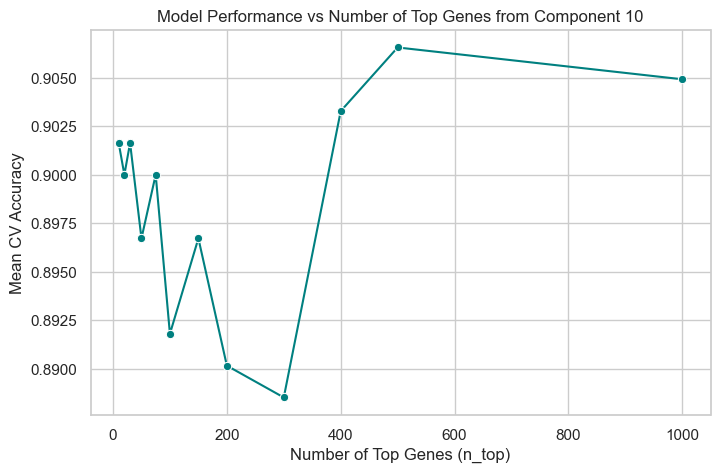

In [29]:
plt.figure(figsize=(8,5))
sns.lineplot(x=n_top_list, y=scores, marker='o', color='teal')
plt.xlabel("Number of Top Genes (n_top)")
plt.ylabel("Mean CV Accuracy")
plt.title("Model Performance vs Number of Top Genes from Component 10")
# plt.xticks(n_top_list)
plt.grid(True)
plt.show()

In [30]:
# Sort by absolute value of loading
n_top = 500  # number of genes you want to select
top_idx = np.argsort(np.abs(col))[-n_top:][::-1]  # indices of top n genes
top_genes = X_train.columns[top_idx]             # select gene names

print(f"Top {n_top} genes for Component 10:")
print(top_genes)

X_train_selected = X_train[top_genes]

Top 500 genes for Component 10:
Index(['PRF1', 'BIN2', 'SELL', 'RAC2', 'AIM2', 'FAM65B', 'PRKCB', 'STX11',
       'CST7', 'KLRD1',
       ...
       'LY96', 'RGL4', 'PRKCQ', 'CFP', 'IKZF3', 'TNF', 'CR1', 'PAQR8', 'GRB2',
       'AMFR'],
      dtype='object', length=500)


In [32]:
pd.DataFrame(top_genes).to_csv('ICA_top_genes.csv')

## Logistic Regression with Reduced Dataset (Component 10 Top 500 Genes)

We see Component 10 has a distinction compared to the other components, so we have chosen the top 500 genes that contributed to Component 10. Next, we are building and tuning our model to get the best parameters.


In [31]:
# X_train = X_train[top_genes].copy()

# Define pipeline
pipe = Pipeline([
    ('scale', StandardScaler()),
    ('model', LogisticRegression(max_iter=50000))
])


# Define parameter grid for tuning
param_grid = {
    'model__C': [0.001, 0.01, 0.1, 1, 10, 100],  # inverse regularization strength
    'model__penalty': ['l1', 'l2'],              # can test 'l1' if using solver='liblinear'
    'model__solver': ['liblinear', 'saga'],
    'model__max_iter': [200000]
}

# 2) Nested CV
outer_cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=123)
nested_scores_auc = []
nested_scores_acc = []

inner_cv_scores = []
best_params_list = []


X = X_train[top_genes].copy()
y = y_train.copy()

i=1
for train_idx, test_idx in outer_cv.split(X,y):
    X_outer_train, X_outer_test = X.iloc[train_idx], X.iloc[test_idx]
    y_outer_train, y_outer_test = y[train_idx], y[test_idx]
    
    # Inner CV for hyperparameter tuning
    inner_cv = StratifiedKFold(n_splits=3, shuffle=True, random_state=42)
    grid_search = GridSearchCV(pipe, param_grid, cv=inner_cv, scoring='accuracy', n_jobs=-1)
    grid_search.fit(X_train, y_train)

    inner_cv_scores.append(float(grid_search.best_score_))
    best_params_list.append(grid_search.best_params_)

    
    # Evaluate best model on outer test fold
    best_inner_model = clone(grid_search.best_estimator_)
    best_inner_model.fit(X_outer_train, y_outer_train)

    y_outer_proba = best_inner_model.predict_proba(X_outer_test)[:, 1]
    auc = roc_auc_score(y_outer_test, y_outer_proba)
    nested_scores_auc.append(auc)

    acc = accuracy_score(y_outer_test, best_inner_model.predict(X_outer_test))
    nested_scores_acc.append(acc)

    print(f'Fold {i} complete')
    i=i+1

print("\nNested CV (unbiased estimate):")
print("Inner fold accuracies:", inner_cv_scores)
print("Outer fold accuracies:", nested_scores_acc)
print(f"Mean Accuracy: {np.mean(nested_scores_acc)} ± {np.std(nested_scores_acc)}")

print("Outer fold ROC-AUC:", nested_scores_auc)
print(f"Mean ROC-AUC: {np.mean(nested_scores_auc)} ± {np.std(nested_scores_auc)}")

# Summarize best parameters across folds
best_params_df = pd.DataFrame(best_params_list)
print("\nBest parameters per outer fold:")
print(best_params_df)

# Choose the most frequent or best-performing parameter set
final_best_params = best_params_df.mode().iloc[0].to_dict()
print("\nFinal chosen parameters for full training:")
print(final_best_params)



Fold 1 complete
Fold 2 complete
Fold 3 complete
Fold 4 complete
Fold 5 complete

Nested CV (unbiased estimate):
Inner fold accuracies: [0.9147831546411668, 0.9147831546411668, 0.9147831546411668, 0.9147831546411668, 0.9147831546411668]
Outer fold accuracies: [0.9508196721311475, 0.9016393442622951, 0.9098360655737705, 0.9098360655737705, 0.9180327868852459]
Mean Accuracy: 0.918032786885246 ± 0.017193587674920494
Outer fold ROC-AUC: [0.9858784893267651, 0.954679802955665, 0.976421188630491, 0.9693152454780362, 0.9790051679586562]
Mean ROC-AUC: 0.9730599788699227 ± 0.010609534480860912

Best parameters per outer fold:
   model__C  model__max_iter model__penalty model__solver
0       0.1           200000             l1          saga
1       0.1           200000             l1          saga
2       0.1           200000             l1          saga
3       0.1           200000             l1          saga
4       0.1           200000             l1          saga

Final chosen parameters for